# DM-25990: ap_pipe run on all five filters of HSC COSMOS 8913 (take 2)

As before, 30+ full-field (103 CCD) visits in each of HSC-G, HSC-R2, HSC-I2, HSC-Z, and HSC-Y.

Last time, there were lots of **database lock errors** and **background noise sources**.

This time, I used PostgreSQL instead of sqlite and implemented difference image variance scaling. **The results were generally very similar, but with no database lock errors.** The difference image variance scaling likely removed a handful of background noise sources but the difference is not stark.

This notebook explores the APDB from this rerun. Some outstanding issues are listed here.

* There is a new APDB issue on [DM-26700](https://jira.lsstcorp.org/browse/DM-26700). It thinks there are duplicate DIA Objects or DIA Forced Sources being written and fails. Let's take a look at what we did get processed.
* As before, there are many failures to retrieve a template which register as "No coadd PhotoCalib found!" which is being tracked on [DM-25988](https://jira.lsstcorp.org/browse/DM-25988) along with some of ancillary issues below.
* As before, some PSFs are erroneously large. However, now that the database lock error is fixed, this is more prevalent, to the point that slurm log messages are too big and crash the whole job. This is likely what is causing fewer visits to be processed than my input visit lists suggest.
* Valid HSC visit numbers are even, so an easy way to get rid of some of the wonky ones (especially prevalent in _g_ and _y_) *should be* to delete the odd visit numbers. However, I revisited my input visit lists, and they don't have any odd numbers, so something odd (pun intended) is happening behind the scenes.
* The difference image variance scaling didn't make a big difference at a glance. The plethora of sources is at least partly due to the fact that HSC images are deeper than DECam images, both in terms of telescope/optics/detector as well as exposure times. I am also not at all convinced that my templates are particularly great, though, and a bunch of ~0 `totFlux` measurements is a bit of a red flag.

In [1]:
%matplotlib notebook

import sys
import numpy as np
import matplotlib.pyplot as plt
import importlib
import pandas as pd

import lsst.daf.persistence as dafPersist

plt.rcParams.update({'figure.max_open_warning': 0})

In [2]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import apdbPlots as pla

In [ ]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(pla)

Last time I broke it down into one repo per filter. This time, **one repo to rule them all**.

In [3]:
repo = '/project/mrawls/cosmos/rerun/ap_pipe-202009'

In [4]:
objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo, dbType='postgres', dbName='lsstdevapdb1')

For fun, let's also load a recent HiTS repo, which has some spatial overlap

In [5]:
repoHits = '/project/mrawls/hits2015/rerun/cw_2020_08'
objTableHits, srcTableHits, goodObjHits, goodSrcHits = pla.loadTables(repoHits)  # this one is just sqlite

In [6]:
goodObj.columns

Index(['diaObjectId', 'ra', 'decl', 'nDiaSources', 'gPSFluxMean',
       'rPSFluxMean', 'iPSFluxMean', 'zPSFluxMean', 'yPSFluxMean',
       'validityEnd', 'flags'],
      dtype='object')

<IPython.core.display.Javascript object>


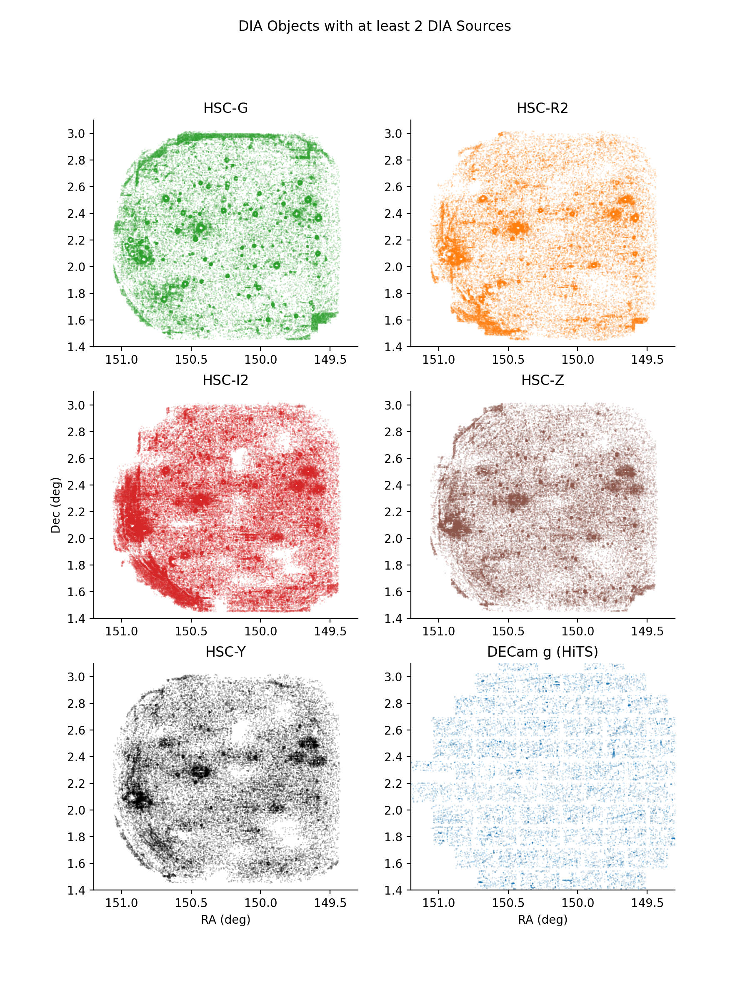

In [7]:
fig, axs = plt.subplots(3, 2, figsize=(9, 12))

fig.suptitle('DIA Objects with at least 2 DIA Sources')

nSrc = 2  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)

axG = axs[0, 0]
axR = axs[0, 1]
axI = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]
axHits = axs[2, 1]

xlim = (151.2, 149.3)
ylim = (1.4, 3.1)
plt.setp(axs, xlim=xlim, ylim=ylim)

goodGFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['gPSFluxMean'] > 0)
goodRFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['rPSFluxMean'] > 0)
goodIFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['iPSFluxMean'] > 0)
goodZFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['zPSFluxMean'] > 0)
goodYFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['yPSFluxMean'] > 0)

axG.scatter(goodObj.loc[goodGFilter, 'ra'],
            goodObj.loc[goodGFilter, 'decl'], c='C2', s=0.1, marker='.', alpha=0.4)
axR.scatter(goodObj.loc[goodRFilter, 'ra'],
            goodObj.loc[goodRFilter, 'decl'], c='C1', s=0.1, marker='.', alpha=0.4)
axI.scatter(goodObj.loc[goodIFilter, 'ra'],
            goodObj.loc[goodIFilter, 'decl'], c='C3', s=0.1, marker='.', alpha=0.4)
axZ.scatter(goodObj.loc[goodZFilter, 'ra'],
            goodObj.loc[goodZFilter, 'decl'], c='C5', s=0.1, marker='.', alpha=0.4)
axY.scatter(goodObj.loc[goodYFilter, 'ra'],
            goodObj.loc[goodYFilter, 'decl'], c='k', s=0.1, marker='.', alpha=0.4)

axHits.scatter(goodObjHits['ra'],
               goodObjHits['decl'], c='C0', s=0.1, marker='.', alpha=0.4)

axY.set_xlabel('RA (deg)')
axHits.set_xlabel('RA (deg)')
axI.set_ylabel('Dec (deg)')

axG.set_title('HSC-G')
axR.set_title('HSC-R2')
axI.set_title('HSC-I2')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')
axHits.set_title('DECam g (HiTS)')

axG.spines['top'].set_visible(False)
axG.spines['right'].set_visible(False)
axR.spines['top'].set_visible(False)
axR.spines['right'].set_visible(False)
axI.spines['top'].set_visible(False)
axI.spines['right'].set_visible(False)
axZ.spines['top'].set_visible(False)
axZ.spines['right'].set_visible(False)
axY.spines['top'].set_visible(False)
axY.spines['right'].set_visible(False)
axHits.spines['top'].set_visible(False)
axHits.spines['right'].set_visible(False)

<IPython.core.display.Javascript object>


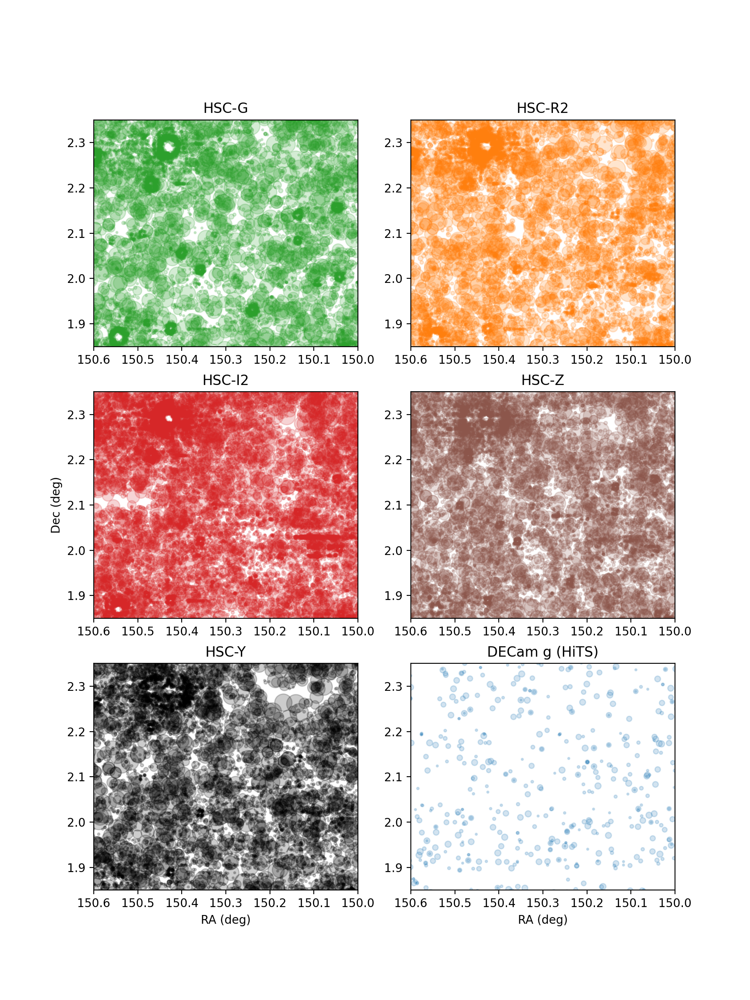

In [8]:
fig, axs = plt.subplots(3, 2, figsize=(9, 12))

axG = axs[0, 0]
axR = axs[0, 1]
axI = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]
axHits = axs[2, 1]

xlim = [150.6, 150.0]
ylim = [1.85, 2.35]
plt.setp(axs, xlim=xlim, ylim=ylim)

goodGFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['gPSFluxMean'] > 0)
goodRFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['rPSFluxMean'] > 0)
goodIFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['iPSFluxMean'] > 0)
goodZFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['zPSFluxMean'] > 0)
goodYFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['yPSFluxMean'] > 0)

axY.set_xlabel('RA (deg)')
axHits.set_xlabel('RA (deg)')
axI.set_ylabel('Dec (deg)')

axG.set_title('HSC-G')
axR.set_title('HSC-R2')
axI.set_title('HSC-I2')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')
axHits.set_title('DECam g (HiTS)')

axG.scatter(goodObj.loc[goodGFilter, 'ra'],
            goodObj.loc[goodGFilter, 'decl'],
            s=goodObj.loc[goodGFilter, 'nDiaSources'], c='C2', marker='o', alpha=0.2)

axR.scatter(goodObj.loc[goodRFilter, 'ra'],
            goodObj.loc[goodRFilter, 'decl'],
            s=goodObj.loc[goodRFilter, 'nDiaSources'], c='C1', marker='o', alpha=0.2)

axI.scatter(goodObj.loc[goodIFilter, 'ra'],
            goodObj.loc[goodIFilter, 'decl'],
            s=goodObj.loc[goodIFilter, 'nDiaSources'], c='C3', marker='o', alpha=0.2)

axZ.scatter(goodObj.loc[goodZFilter, 'ra'],
            goodObj.loc[goodZFilter, 'decl'],
            s=goodObj.loc[goodZFilter, 'nDiaSources'], c='C5', marker='o', alpha=0.2)

axY.scatter(goodObj.loc[goodYFilter, 'ra'],
            goodObj.loc[goodYFilter, 'decl'],
            s=goodObj.loc[goodYFilter, 'nDiaSources'], c='k', marker='o', alpha=0.2)

axHits.scatter(goodObjHits.loc[goodObjHits['nDiaSources'] > nSrc, 'ra'],
               goodObjHits.loc[goodObjHits['nDiaSources'] > nSrc, 'decl'],
               s=goodObjHits.loc[goodObjHits['nDiaSources'] > nSrc, 'nDiaSources'], c='C0', marker='o', alpha=0.2)

### Show DIA Sources broken out by visit
This is a nice at-a-glance way to see how much data was processed and if any visits look weird.

<IPython.core.display.Javascript object>


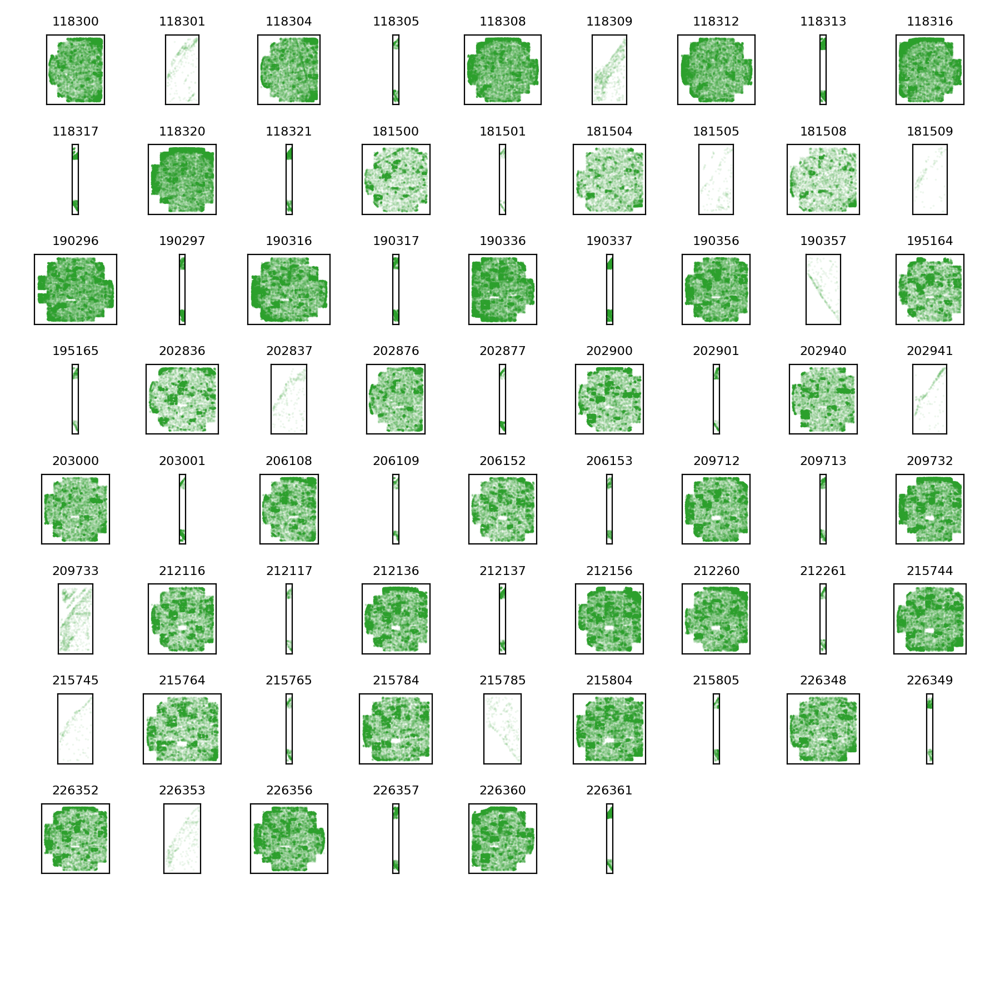

In [9]:
pla.plotDiaSourcesOnSkyGrid(repo, goodSrc.loc[goodSrc['filterName'] == 'g'], color='C2')

<IPython.core.display.Javascript object>


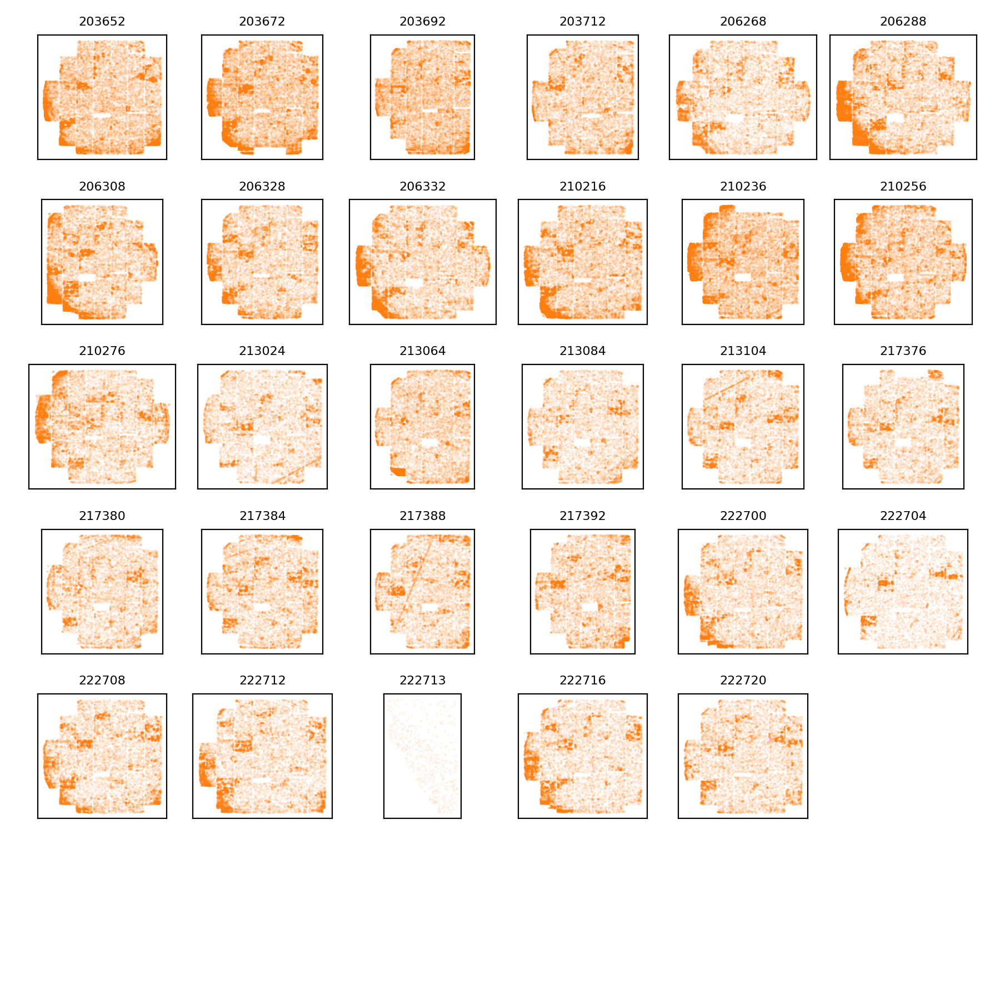

In [10]:
pla.plotDiaSourcesOnSkyGrid(repo, goodSrc.loc[goodSrc['filterName'] == 'r'], color='C1')

<IPython.core.display.Javascript object>


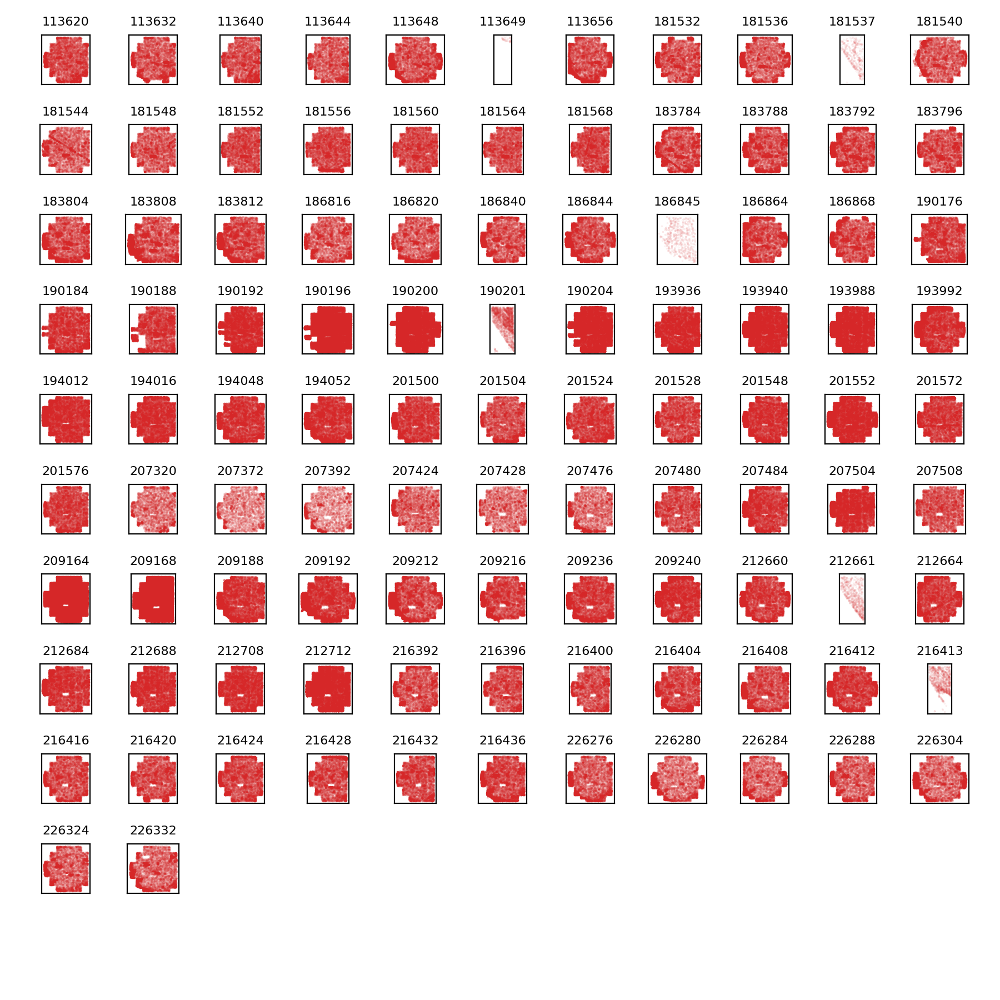

In [11]:
pla.plotDiaSourcesOnSkyGrid(repo, goodSrc.loc[goodSrc['filterName'] == 'i'], color='C3')

# last 8 visits missing?

<IPython.core.display.Javascript object>


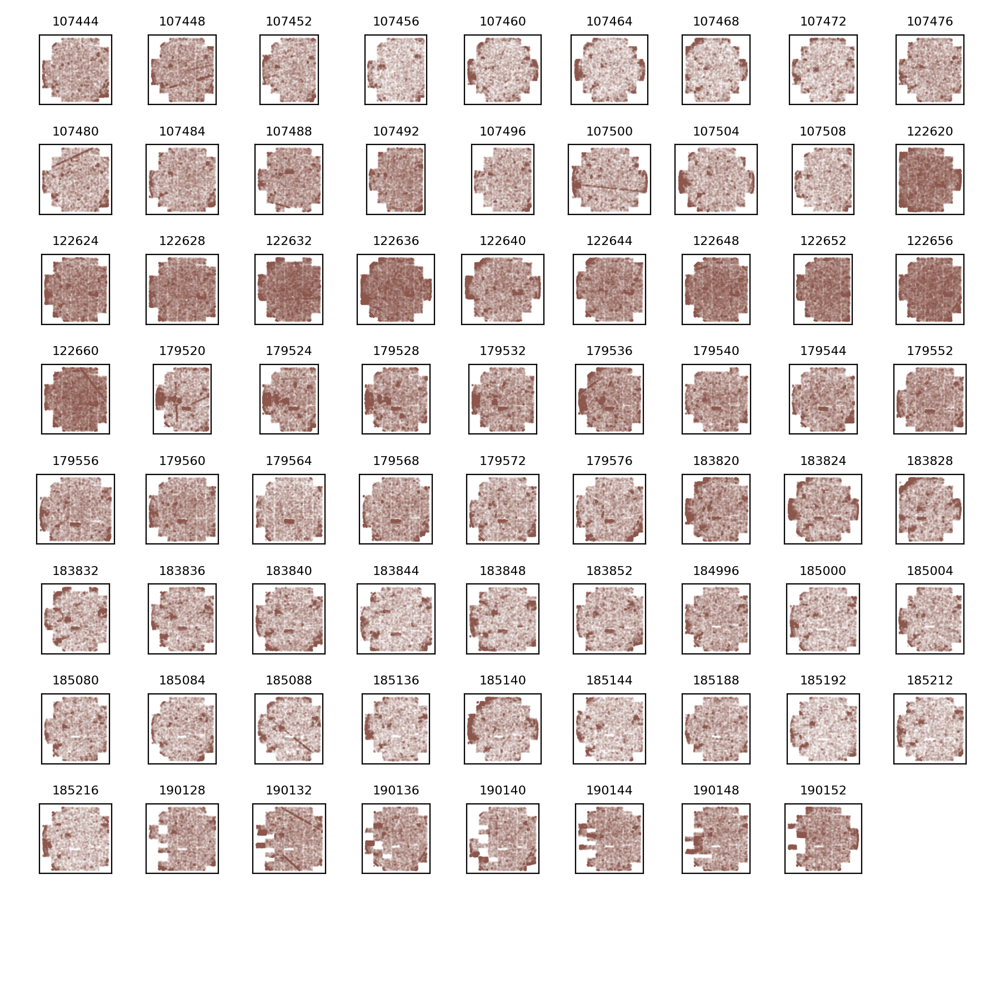

In [12]:
pla.plotDiaSourcesOnSkyGrid(repo, goodSrc.loc[goodSrc['filterName'] == 'z'], color='C5')

# last 47 visits missing?

<IPython.core.display.Javascript object>


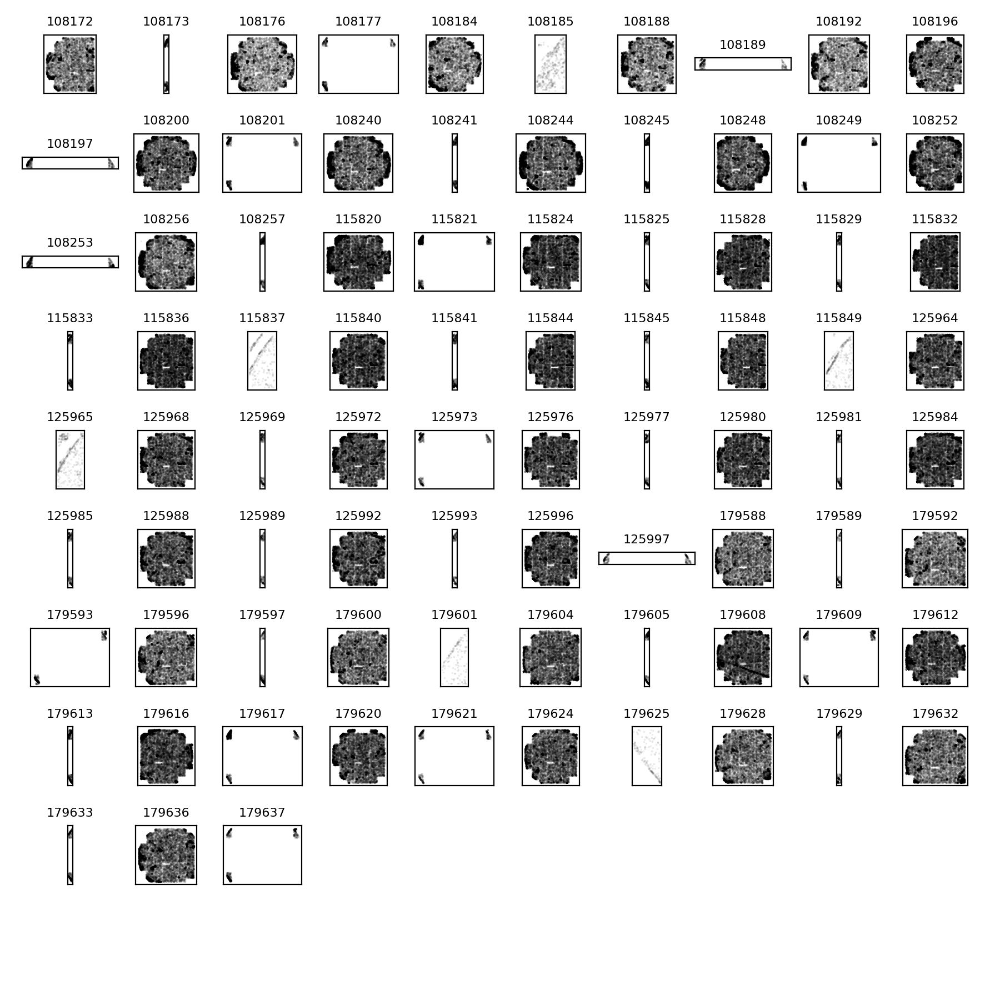

In [13]:
pla.plotDiaSourcesOnSkyGrid(repo, goodSrc.loc[goodSrc['filterName'] == 'y'], color='k')

# last 134 visits missing?

<IPython.core.display.Javascript object>


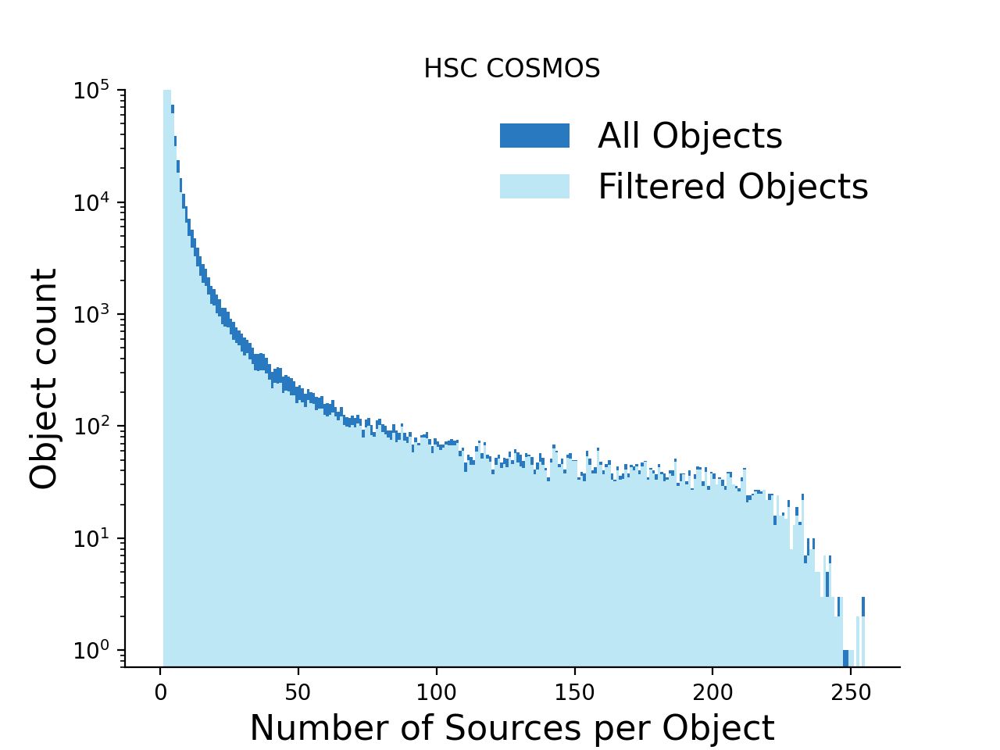

In [14]:
hist = doa.plotDiaObjectHistogram(objTable, goodObj, title='HSC COSMOS')

In [15]:
print(len(goodSrc), len(goodObj))

5229095 2306176


## And now, flux histograms galore

Recall `psFlux` is the PSF flux of the DIA Source measured on the difference image while `totFlux` is the flux measured on the calexp at the location of the DIA Source.

We expect to see negative and positive `psFlux` values because it's difference imaging and but any negative `totFlux` values are an error, such as a background over-subtraction situation.

In [16]:
def plotFluxHistSrc(srcTable1, srcTable2=None, fluxType='psFlux', label1=None, label2=None, title=None, ylog=False,
                    color1='#2979C1', color2='#Bee7F5'):
    plt.figure()
    plt.xlabel(fluxType, size=12)
    plt.ylabel('DIA Source count', size=12)
    #bins = np.concatenate((-1*np.flip(np.logspace(-1, 6, 50)), np.logspace(-1, 6, 50)))
    bins = np.linspace(-3e3, 3e3, 200)
    if ylog:
        plt.yscale('log')
    #plt.xscale('symlog')
    plt.hist(srcTable1[fluxType].values, bins=bins, color=color1, label=label1)
    if srcTable2 is not None:
        plt.hist(srcTable2[fluxType].values, bins=bins, color=color2, label=label2)
    if label1:
        plt.legend(frameon=False, fontsize=12)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


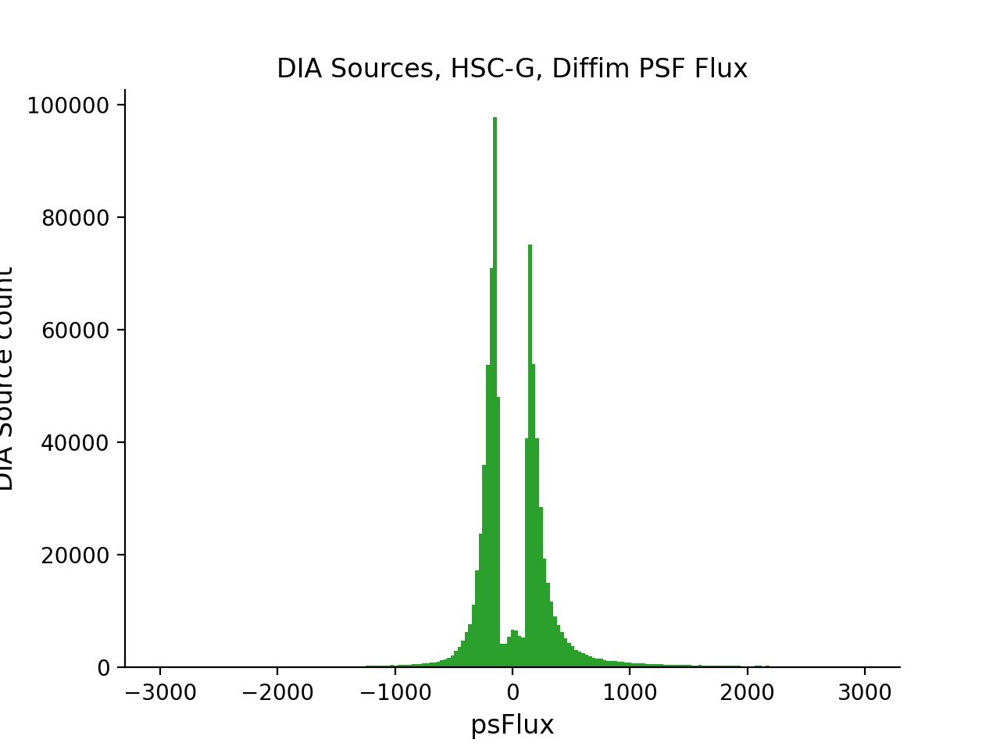

In [17]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'g'], fluxType='psFlux',
                title='DIA Sources, HSC-G, Diffim PSF Flux', color1='C2')

<IPython.core.display.Javascript object>


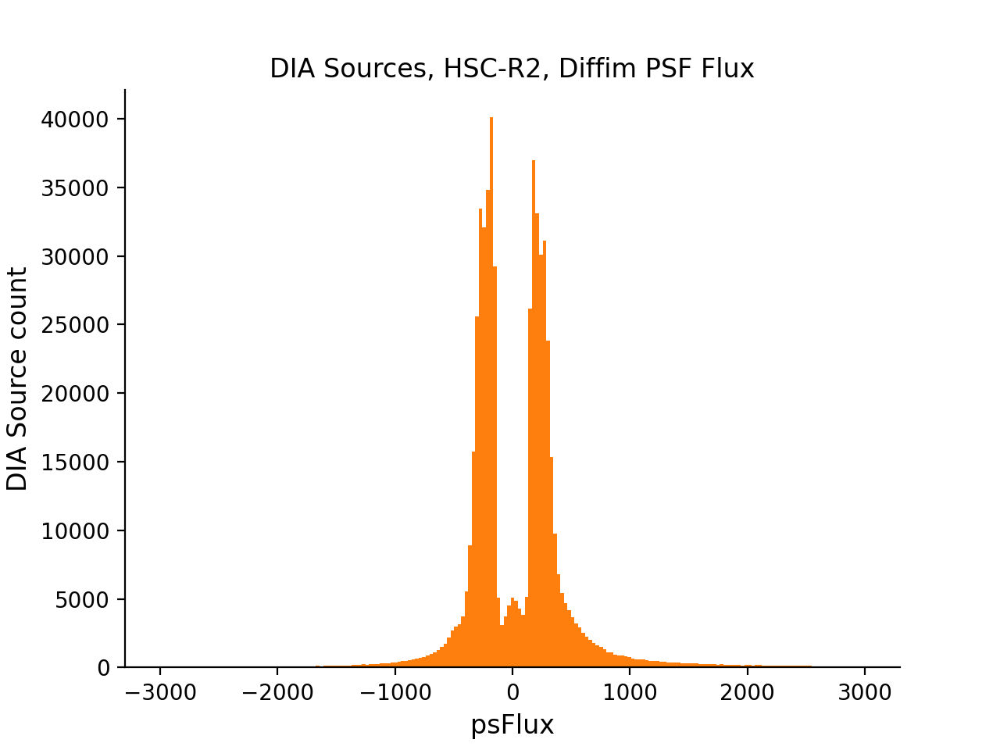

In [18]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'r'], fluxType='psFlux',
                title='DIA Sources, HSC-R2, Diffim PSF Flux', color1='C1')

<IPython.core.display.Javascript object>


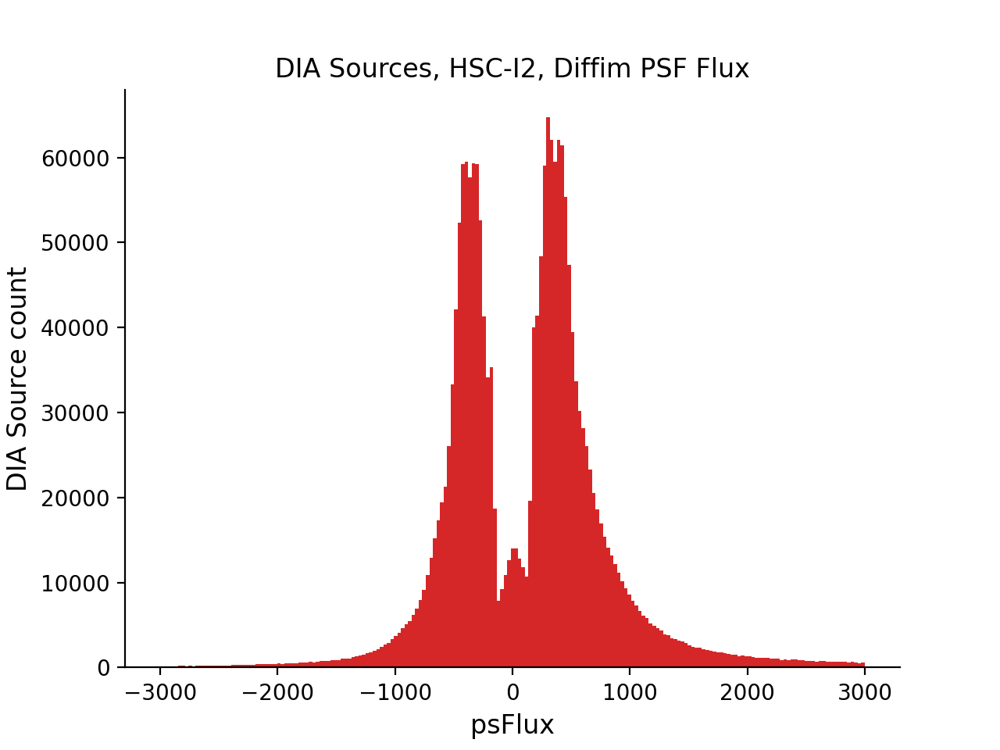

In [19]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'i'], fluxType='psFlux',
                title='DIA Sources, HSC-I2, Diffim PSF Flux', color1='C3')

<IPython.core.display.Javascript object>


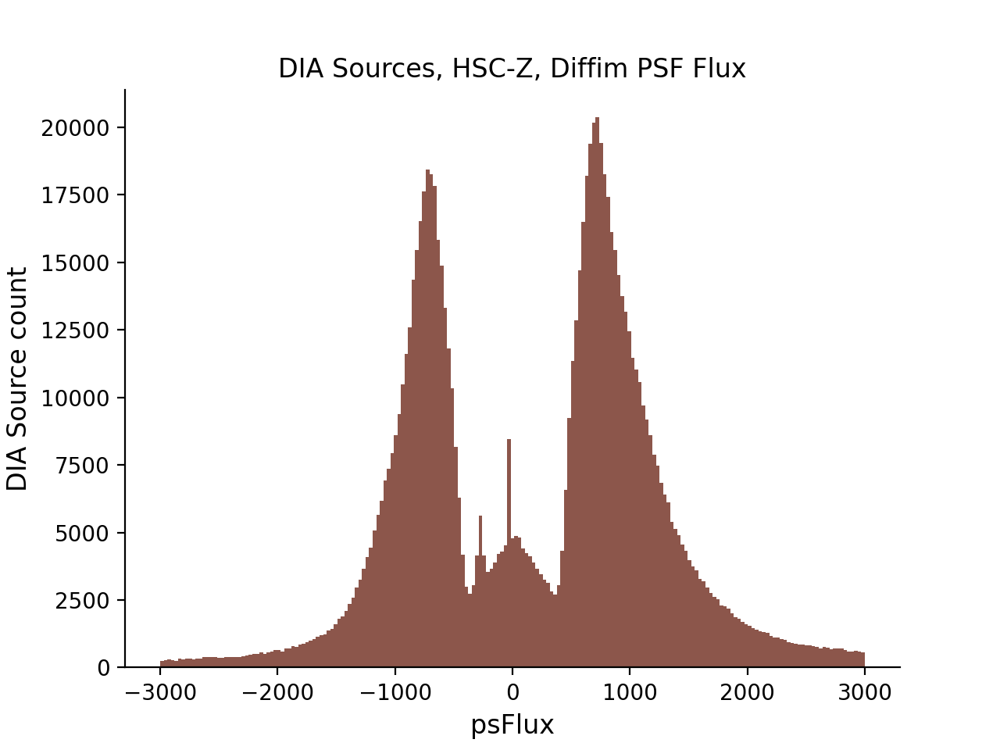

In [20]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'z'], fluxType='psFlux',
                title='DIA Sources, HSC-Z, Diffim PSF Flux', color1='C5')

<IPython.core.display.Javascript object>


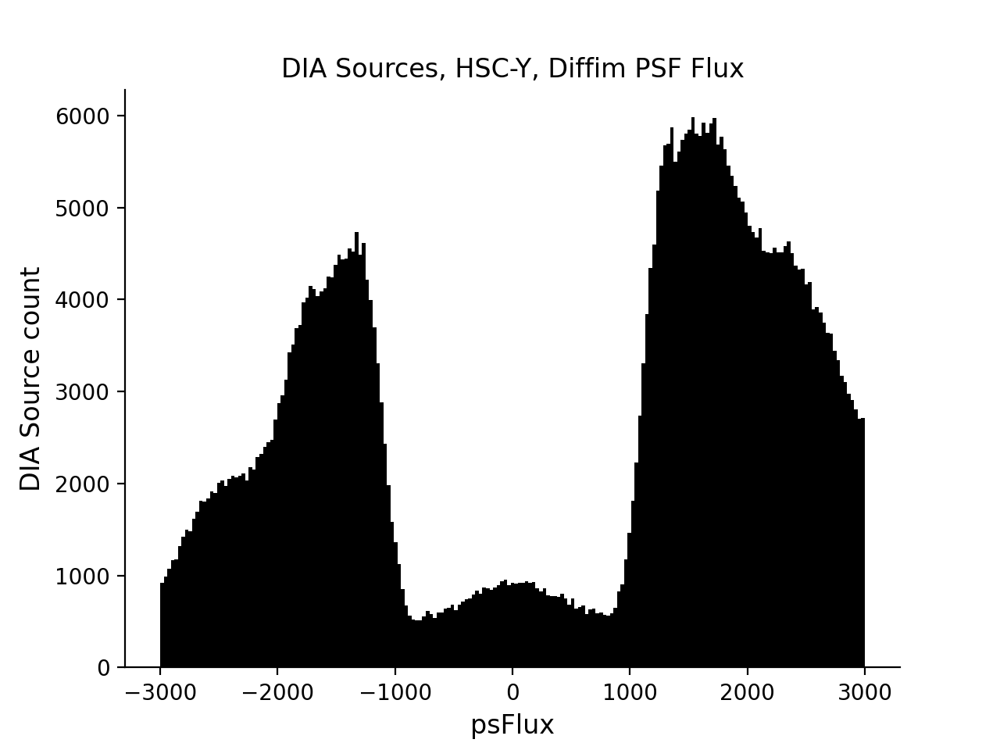

In [21]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'y'], fluxType='psFlux',
                title='DIA Sources, HSC-Y, Diffim PSF Flux', color1='k')

<IPython.core.display.Javascript object>


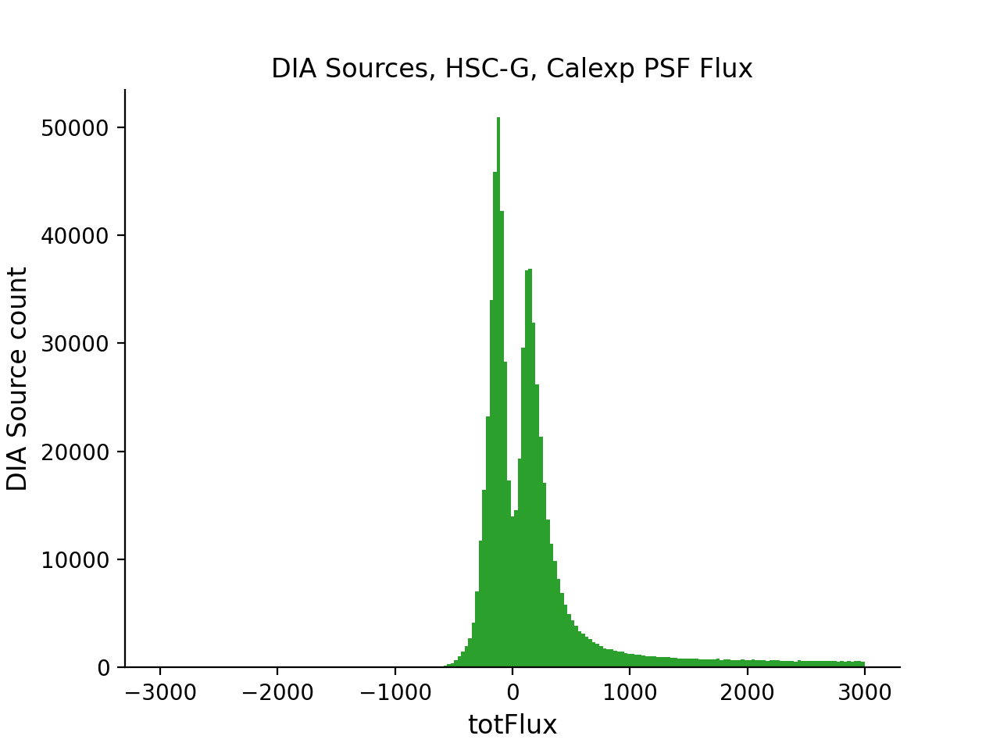

In [23]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'g'], fluxType='totFlux',
                title='DIA Sources, HSC-G, Calexp PSF Flux', color1='C2')

<IPython.core.display.Javascript object>


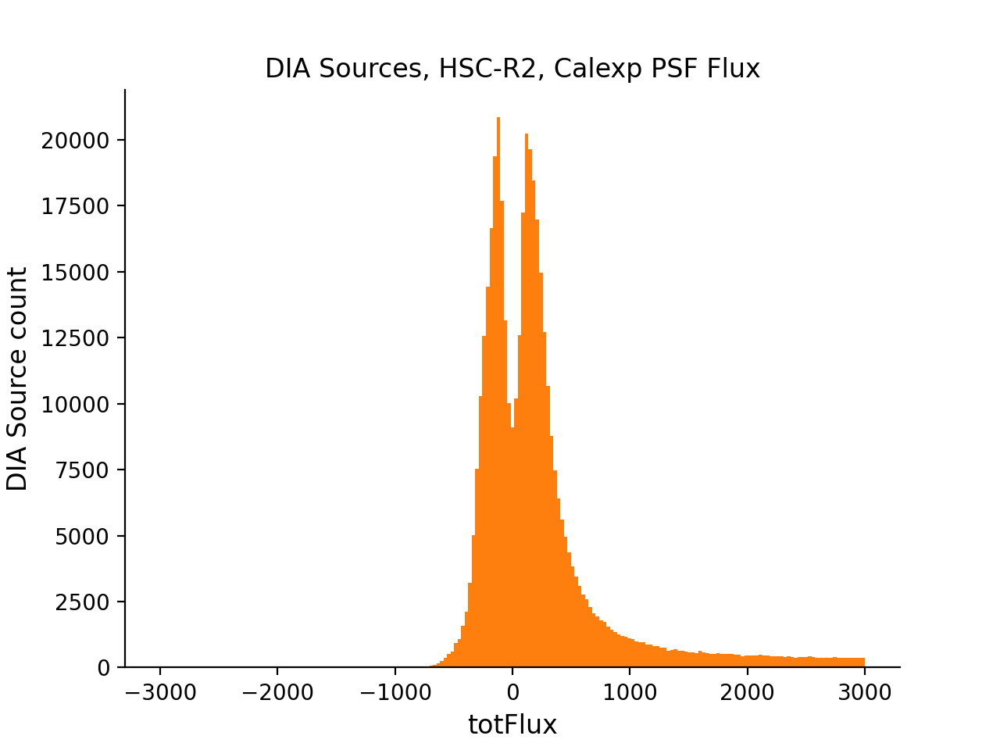

In [24]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'r'], fluxType='totFlux',
                title='DIA Sources, HSC-R2, Calexp PSF Flux', color1='C1')

<IPython.core.display.Javascript object>


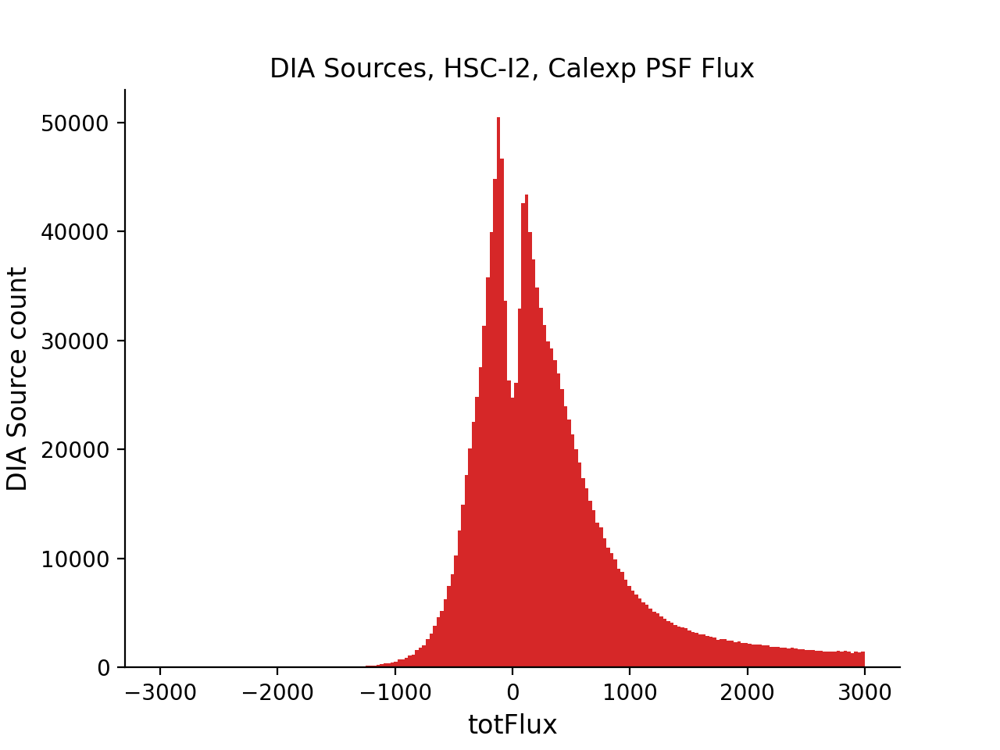

In [25]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'i'], fluxType='totFlux',
                title='DIA Sources, HSC-I2, Calexp PSF Flux', color1='C3')

<IPython.core.display.Javascript object>


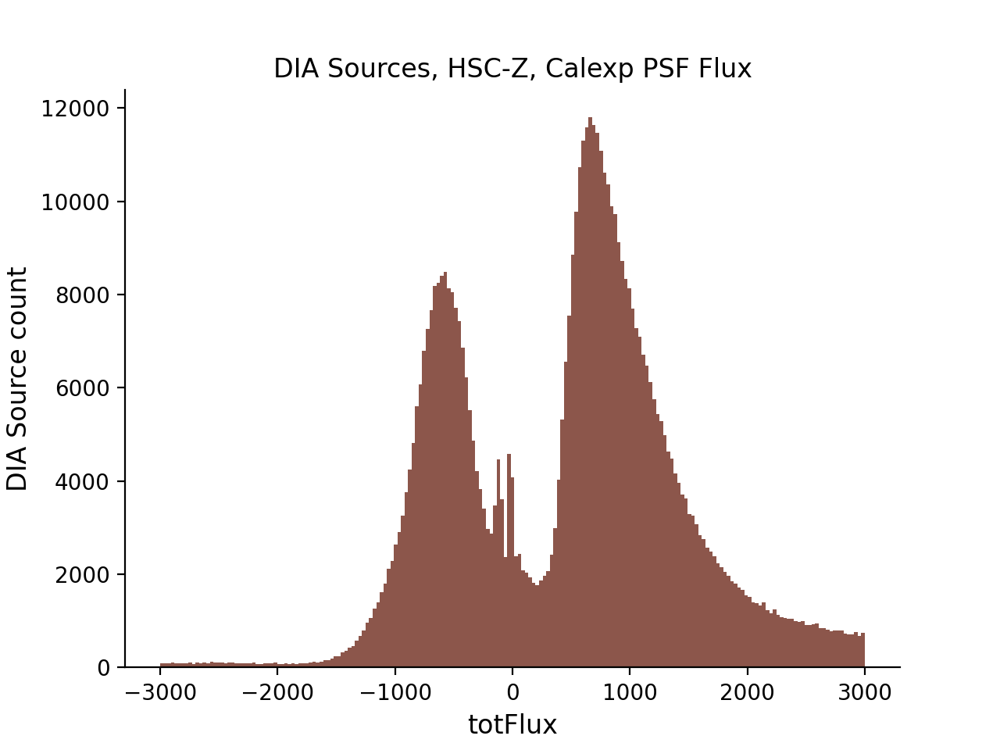

In [26]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'z'], fluxType='totFlux',
                title='DIA Sources, HSC-Z, Calexp PSF Flux', color1='C5')

<IPython.core.display.Javascript object>


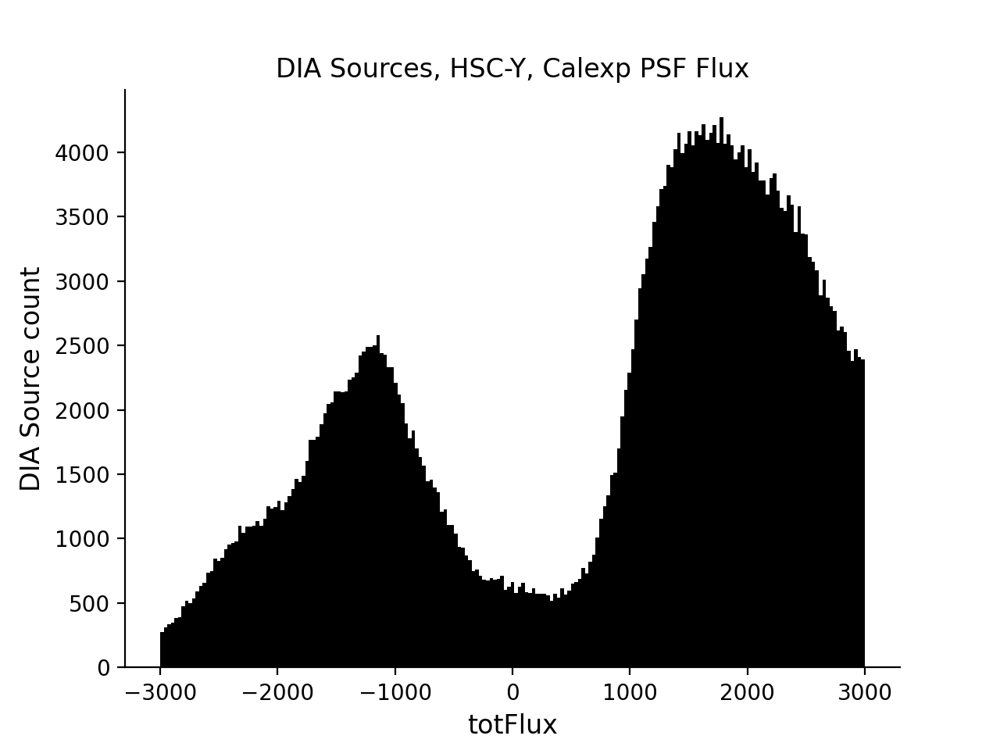

In [27]:
plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == 'y'], fluxType='totFlux',
                title='DIA Sources, HSC-Y, Calexp PSF Flux', color1='k')

<IPython.core.display.Javascript object>


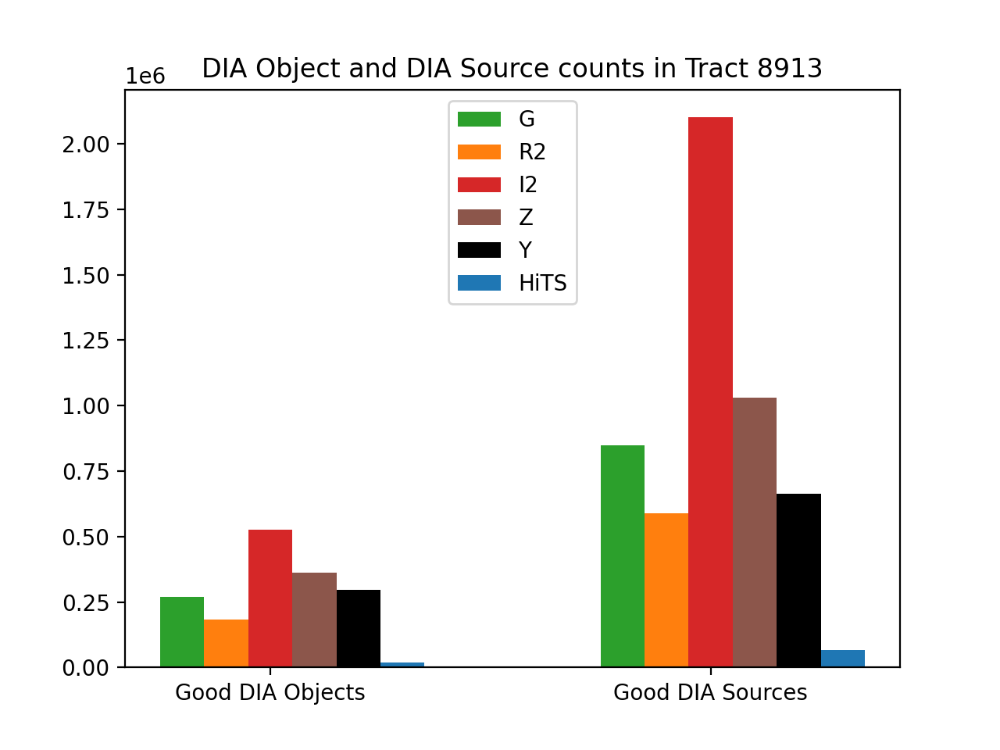

Text(0.5, 1.0, 'DIA Object and DIA Source counts in Tract 8913')

In [28]:
fig, ax = plt.subplots()
barLabels = ['Good DIA Objects', 'Good DIA Sources']
xbar = np.array([0, 1])
width = 0.2

hitsObjCompare = (goodObjHits['decl'] > 0)
hitsSrcCompare = (goodSrcHits['decl'] > 0)

goodObjG = goodObj.loc[goodObj['gPSFluxMean'] > 0]
goodObjR = goodObj.loc[goodObj['rPSFluxMean'] > 0]
goodObjI = goodObj.loc[goodObj['iPSFluxMean'] > 0]
goodObjZ = goodObj.loc[goodObj['zPSFluxMean'] > 0]
goodObjY = goodObj.loc[goodObj['yPSFluxMean'] > 0]

goodSrcG = goodSrc.loc[goodSrc['filterName'] == 'g']
goodSrcR = goodSrc.loc[goodSrc['filterName'] == 'r']
goodSrcI = goodSrc.loc[goodSrc['filterName'] == 'i']
goodSrcZ = goodSrc.loc[goodSrc['filterName'] == 'z']
goodSrcY = goodSrc.loc[goodSrc['filterName'] == 'y']

ax.bar(xbar - width, [len(goodObjG), len(goodSrcG)], width/2, label='G', color='C2')
ax.bar(xbar - width/2, [len(goodObjR), len(goodSrcR)], width/2, label='R2', color='C1')
ax.bar(xbar, [len(goodObjI), len(goodSrcI)], width/2, label='I2', color='C3')
ax.bar(xbar + width/2, [len(goodObjZ), len(goodSrcZ)], width/2, label='Z', color='C5')
ax.bar(xbar + width, [len(goodObjY), len(goodSrcY)], width/2, label='Y', color='k')
ax.bar(xbar + width + width/2, [len(goodObjHits[hitsObjCompare]), len(goodSrcHits[hitsSrcCompare])],
       width/2, label='HiTS', color='C0')

plt.legend(loc='upper center')
ax.set_xticks([0, 1])
labels = ax.set_xticklabels(barLabels)
plt.title('DIA Object and DIA Source counts in Tract 8913')